# **Define Problem**

This dataset is characterized by its large dimensions, consisting of 256 features or variables along with a dedicated label column. It has been generated through testing and experimentation for the purpose of classifying a specific disease. However, the specific disease being classified is not disclosed within the dataset. The substantial dimensionality of this dataset indicates complexity and potential challenges in the modeling and analysis processes ahead.

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import math

from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


## **Import Dataset**

In [2]:
# read dataset
df = pd.read_csv("Dataset_Classification.csv")

# **Exploratory Data Analysis**

In [3]:
# Displaying the First Few Rows of the Dataset
df.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x248,x249,x250,x251,x252,x253,x254,x255,x256,label
0,-1.032690,2.096221,0.384194,-1.214555,2.432575,1.069743,-1.076878,2.140959,0.403971,-1.039528,...,2.423807,0.833363,-0.932956,2.047133,0.089361,-1.062281,2.080691,0.412019,-1.244573,3
1,-0.509585,-0.896533,-0.465612,0.033544,-0.781463,-0.934908,0.061976,-0.712155,-0.929289,-0.624238,...,-0.783508,-0.877666,0.084089,-0.718668,-0.965767,-0.567989,-0.911335,-0.415529,0.167377,3
2,-1.032690,-0.896533,1.243594,-1.101241,-0.781463,-0.934908,-0.355857,-0.020836,-0.726172,-1.039528,...,-0.783508,-0.851601,-0.481456,0.041508,-0.623651,-1.062281,-0.911335,1.288949,-1.201469,0
3,-1.024914,1.367049,0.014966,-1.141605,1.102526,0.197138,-0.921322,1.064377,0.235659,-0.973558,...,1.228601,0.089344,-0.932956,1.093751,0.017282,-0.920086,1.336901,0.012367,-0.990998,3
4,1.585219,-0.896533,-0.782318,0.692780,-0.781463,0.732274,-0.113010,-1.048795,1.248580,1.636419,...,-0.783508,0.902548,0.000080,-1.049062,1.518648,1.607938,-0.911335,-0.824106,0.663292,0


In [4]:
# Check the dataset dimensions
df.shape

(3264, 257)

In [5]:
# Check Column Names
col_names = df.columns

col_names

Index(['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       ...
       'x248', 'x249', 'x250', 'x251', 'x252', 'x253', 'x254', 'x255', 'x256',
       'label'],
      dtype='object', length=257)

In [6]:
# Viewing dataset summary
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3264 entries, 0 to 3263
Columns: 257 entries, x1 to label
dtypes: float64(256), int64(1)
memory usage: 6.4 MB


In [7]:
# Checking for Categorical Variables in the Dataset
categorical = [var for var in df.columns if df[var].dtype=='O']
print('There are {} categorical variables'.format(len(categorical)))

There are 0 categorical variables


In [8]:
# Examining the Label Column which Contains Integer Data
df.label.info()

<class 'pandas.core.series.Series'>
RangeIndex: 3264 entries, 0 to 3263
Series name: label
Non-Null Count  Dtype
--------------  -----
3264 non-null   int64
dtypes: int64(1)
memory usage: 25.6 KB


In [9]:
# Displaying Summary Statistics for the Dataset
print(round(df.describe()),2)

           x1      x2      x3      x4      x5      x6      x7      x8      x9  \
count  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0   
mean     -0.0     0.0     0.0    -0.0     0.0    -0.0    -0.0     0.0    -0.0   
std       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
min      -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0   
25%      -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0    -1.0   
50%      -0.0    -0.0    -0.0    -0.0    -1.0    -0.0    -0.0     0.0    -0.0   
75%       1.0     1.0     1.0     1.0     1.0     1.0     0.0     1.0     0.0   
max       3.0     3.0     4.0     5.0     4.0     5.0     5.0     3.0     3.0   

          x10  ...    x248    x249    x250    x251    x252    x253    x254  \
count  3264.0  ...  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0  3264.0   
mean     -0.0  ...     0.0    -0.0    -0.0     0.0    -0.0    -0.0     0.0   
std       1.0  ...     1.0     1.0  

In [10]:
# Checking for Missing Values in the Dataset

null_counts = df.isnull().sum()
null_counts = null_counts[null_counts > 0]
print(null_counts)

Series([], dtype: int64)


In [11]:
# Checking for NaN (Not a Number) values in the dataset, and it's found that there are none.

df.isna().sum()[df.isna().sum() != 0]

Series([], dtype: int64)

In [12]:
# Checking the types or categories of labels for classification

df.label.unique()

array([3, 0, 2, 1])

## Check whether there is a linear trend in the data

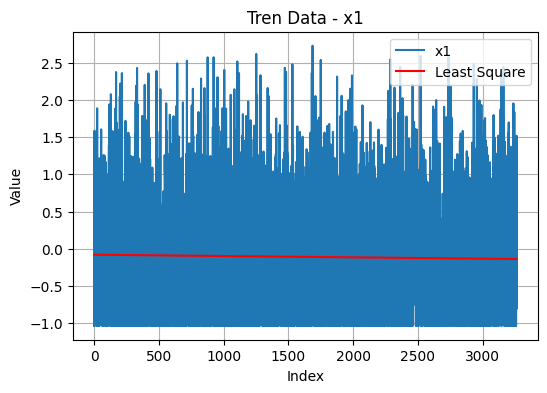

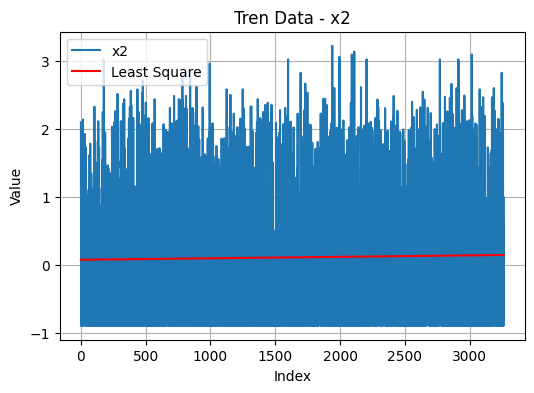

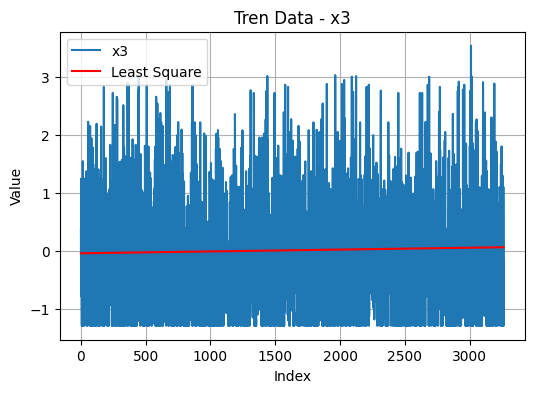

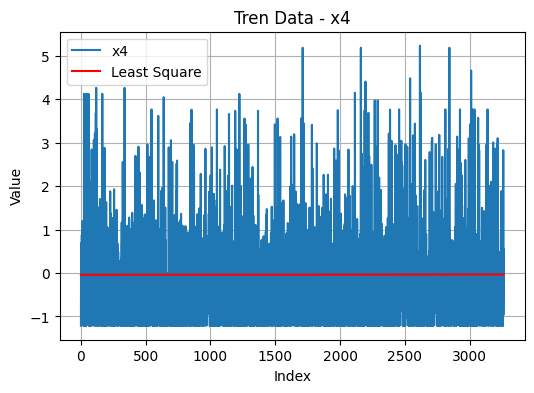

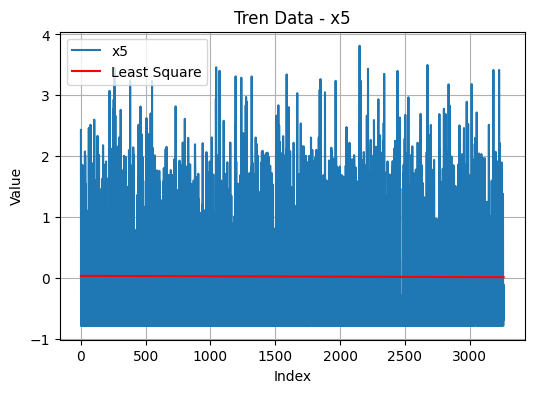

...

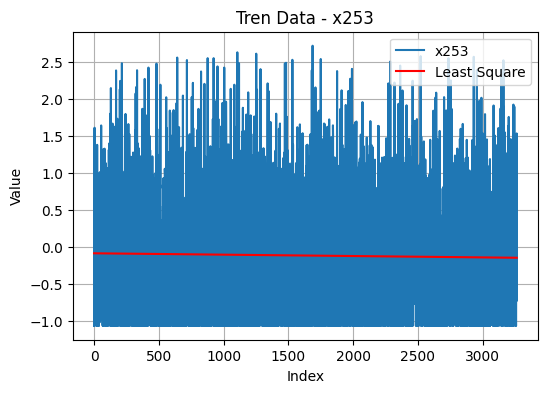

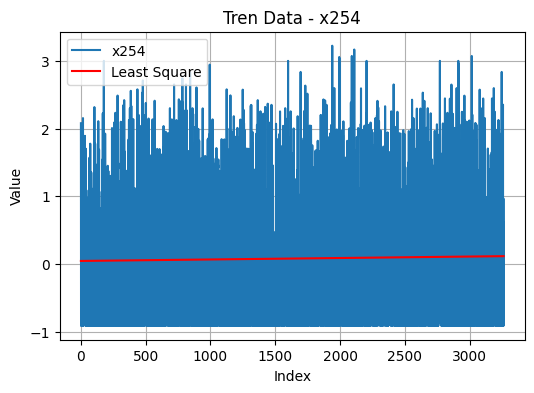

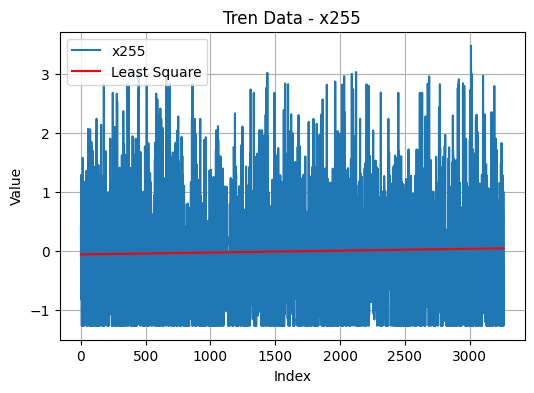

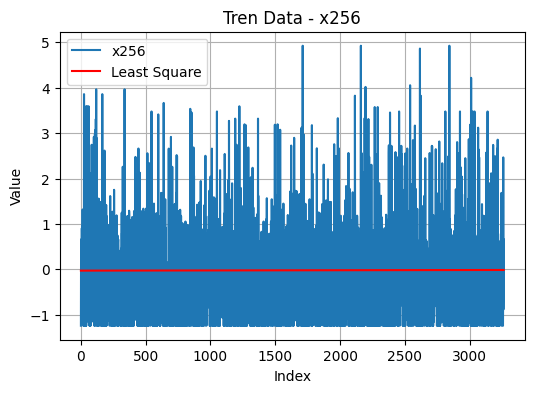

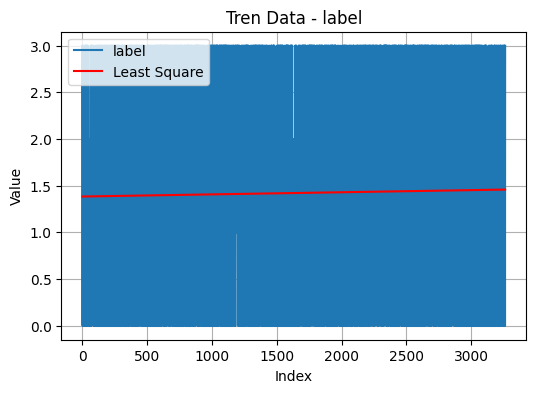

In [13]:
# Loop to create a line graph for each column
for column in df.columns:
    plt.figure(figsize=(6, 4))
    plt.plot(df[column], label=column)

    # Fit garis least square
    x = np.arange(len(df[column]))
    y = df[column].values
    coeffs = np.polyfit(x, y, 1)
    y_fit = np.polyval(coeffs, x)

    plt.plot(x, y_fit, color='red', label='Least Square')

    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Tren Data - {}'.format(column))
    plt.grid(True)
    plt.legend()
    plt.show()

**💡 Insight**: All the data doesn't exhibit a distinct trend, as evident from the relatively stable least square lines. Therefore, a non-linear model is required to capture the underlying patterns.

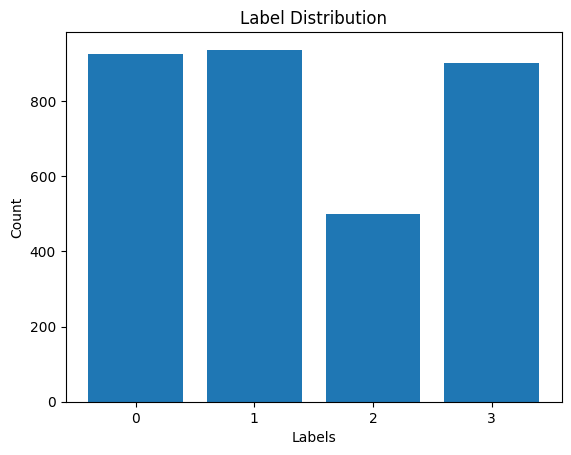

In [14]:
# Viewing the frequency of each label
unique_labels, label_counts = np.unique(df['label'], return_counts=True)

plt.bar(range(len(unique_labels)), label_counts)
plt.title("Label Distribution")
plt.xlabel("Labels")
plt.ylabel("Count")
plt.xticks(range(len(unique_labels)), unique_labels)

plt.show()

**💡 Insight:** The distribution of the labels is not identical, but it still falls within a reasonable range of normality. The majority label (1) and the minority label (2) have a ratio of around 2:1. Given this distribution, I believe oversampling might not be necessary.

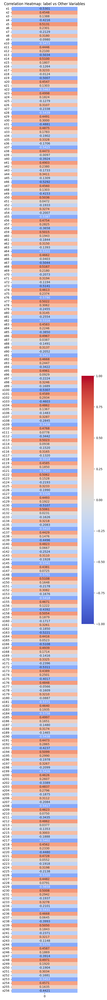

In [15]:
# Calculating the correlation between other variables and the "label"
correlation = df.drop('label', axis=1).corrwith(df['label'])

# Creating a correlation heatmap
plt.figure(figsize=(5, 60))
heatmap = sns.heatmap(correlation.to_frame(), annot=True, cmap="coolwarm", fmt=".4f", vmin=-1, vmax=1, cbar=True)
plt.title("Correlation Heatmap: label vs Other Variables")
plt.show()

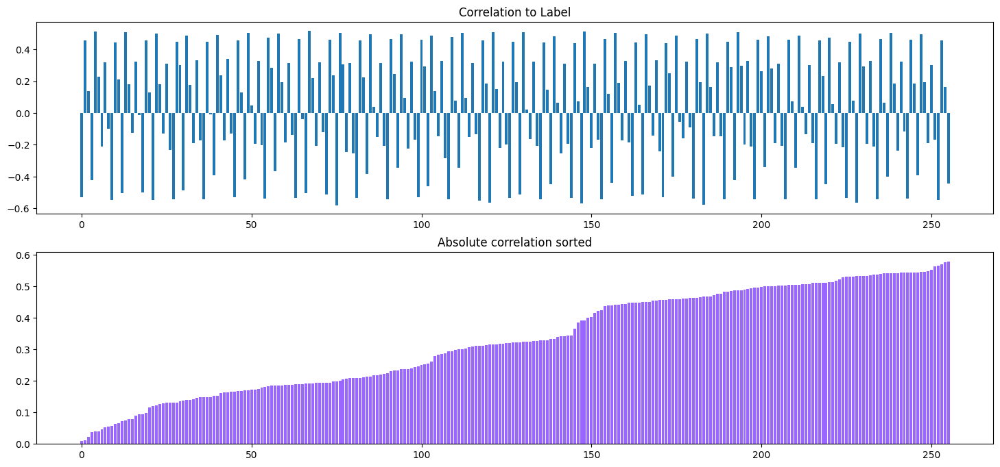

In [16]:
plt.figure(figsize=(18, 8))

plt.subplot(211)
plt.bar(range(256), df.corr().iloc[:-1, -1])
plt.title("Correlation to Label")

plt.subplot(212)
plt.bar(range(256), np.sort(np.abs(df.corr().iloc[:-1, -1].to_numpy())), color="#9966ff")
plt.title("Absolute correlation sorted")
plt.show()

**💡 Insight:** The correlation of each column with the label exhibits a scattered linear pattern. There's a mix of low and high correlations, with nearly an equal number of columns showing both positive and negative correlations. The visualization indicates promise in the data due to the presence of many highly correlated variables. I refrained from visualizing correlations between columns as I deemed it irrelevant for this classification case.

Another hypothesis could be inferred that the label order doesn't signify a specific scale, such as stages in a disease (a classification resembling regression). This is supported by the irregular correlations and linear distribution, implying no clear interconnection between correlations and label predictions.

In [17]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(df.iloc[:, :-1])

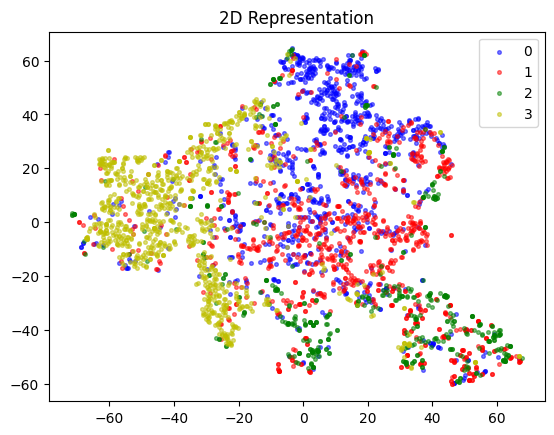

In [18]:
plt.title("2D Representation")
plt.scatter(X_tsne[df["label"] == 0, 0],X_tsne[df["label"] == 0, 1], alpha=0.5, c="b", s=7)
plt.scatter(X_tsne[df["label"] == 1, 0],X_tsne[df["label"] == 1, 1], alpha=0.5, c="r", s=7)
plt.scatter(X_tsne[df["label"] == 2, 0],X_tsne[df["label"] == 2, 1], alpha=0.5, c="g", s=7)
plt.scatter(X_tsne[df["label"] == 3, 0],X_tsne[df["label"] == 3, 1], alpha=0.5, c="y", s=7)
plt.legend([0, 1, 2, 3])
plt.show()

**💡 Insight:** Clusters within the labels are shown in the 2D plotting using t-SNE (t-Distributed Stochastic Neighbor Embedding) in the image above. This visualization supports the need for a non-linear model, despite the difficulty of the cluster separations.

## Check the outlier

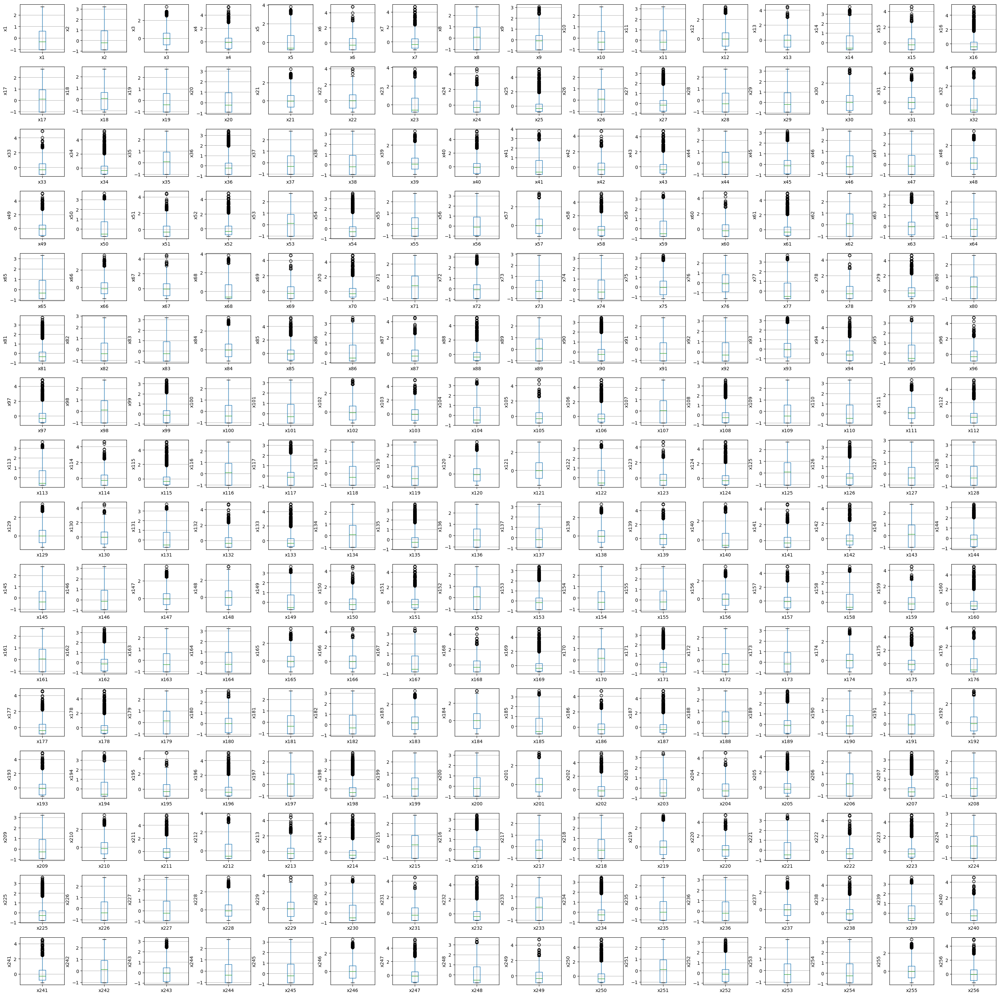

In [19]:
# Conducting box plots to check for the presence of outliers.

num_cols = 256
num_rows = math.ceil(num_cols / 16)

plt.figure(figsize=(30, 30))

for i in range(1, num_cols + 1):
    plt.subplot(num_rows, 16, i)
    col_name = 'x{}'.format(i)
    fig = df.boxplot(column=col_name)
    fig.set_title('')
    fig.set_ylabel(col_name)

plt.tight_layout()
plt.show()


**💡 Insight:** Based on the plotted results above, there are quite a few columns with outliers. Due to the large dataset, a check is performed to gather the names of columns that contain outliers. This examination employs the Interquartile Range (IQR) method, comparing the lower and upper bounds for identification.

In [20]:
outlier_columns = []  # List to store column names with outliers

for i in range(1, 257):
    column_name = 'x{}'.format(i)
    data = df[column_name]
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1  # IQR is the interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = (data < lower_bound) | (data > upper_bound)
    if outliers.any():
        outlier_columns.append(column_name)  # If there are outliers, add the column to the list.

print("Columns with Outliers:")
print(outlier_columns)

Columns with Outliers:
['x3', 'x4', 'x5', 'x6', 'x7', 'x9', 'x12', 'x13', 'x14', 'x15', 'x16', 'x21', 'x22', 'x23', 'x24', 'x25', 'x27', 'x30', 'x31', 'x32', 'x33', 'x34', 'x36', 'x39', 'x40', 'x41', 'x42', 'x43', 'x45', 'x48', 'x49', 'x50', 'x51', 'x52', 'x54', 'x57', 'x58', 'x59', 'x60', 'x61', 'x63', 'x66', 'x67', 'x68', 'x69', 'x70', 'x72', 'x75', 'x77', 'x78', 'x79', 'x81', 'x84', 'x85', 'x86', 'x87', 'x88', 'x90', 'x93', 'x94', 'x95', 'x96', 'x97', 'x99', 'x102', 'x103', 'x104', 'x105', 'x106', 'x108', 'x111', 'x112', 'x113', 'x114', 'x115', 'x117', 'x120', 'x122', 'x123', 'x124', 'x126', 'x129', 'x130', 'x131', 'x132', 'x133', 'x135', 'x138', 'x139', 'x140', 'x141', 'x142', 'x144', 'x147', 'x148', 'x149', 'x150', 'x151', 'x153', 'x156', 'x157', 'x158', 'x159', 'x160', 'x162', 'x165', 'x166', 'x167', 'x168', 'x169', 'x171', 'x174', 'x175', 'x176', 'x177', 'x178', 'x180', 'x183', 'x184', 'x185', 'x186', 'x187', 'x189', 'x192', 'x193', 'x194', 'x195', 'x196', 'x198', 'x201', 'x202'

In [21]:
# Observing the size or the number of columns with outliers. Out of 256 data points, 167 of them have outliers.
len(outlier_columns)

167

## Visualisasi outlier


Below are the box plot visualizations for each of the outlier columns.

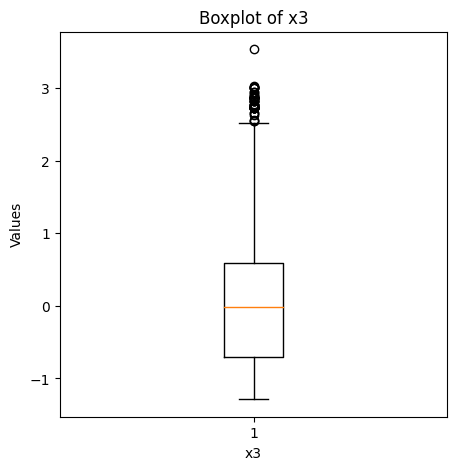

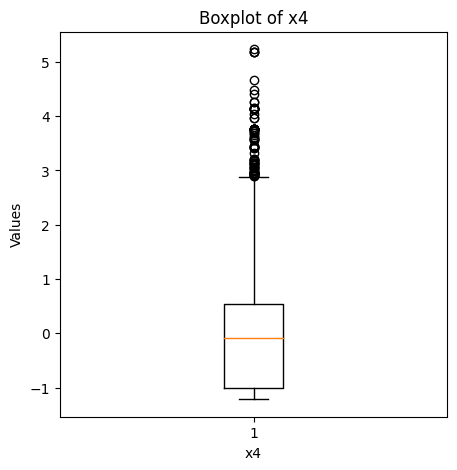

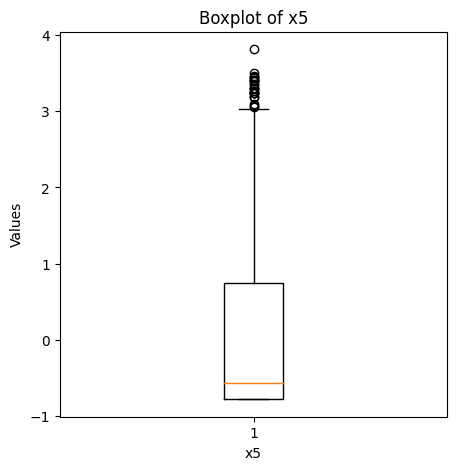

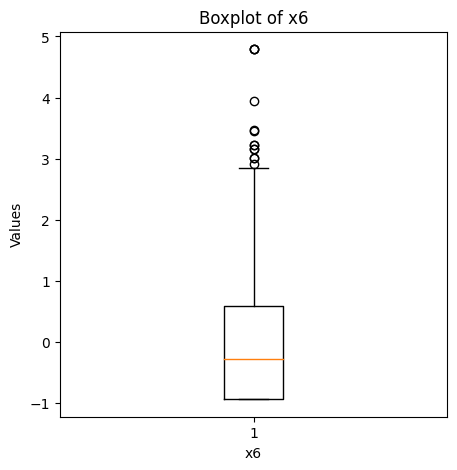

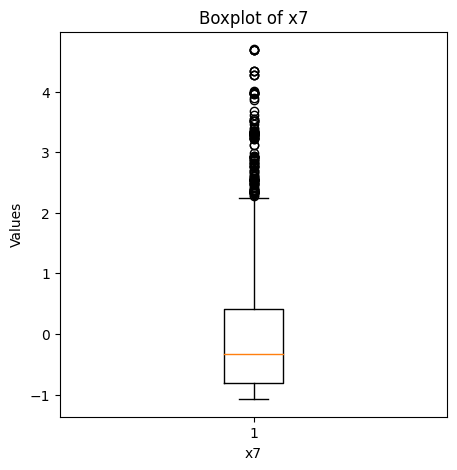

...

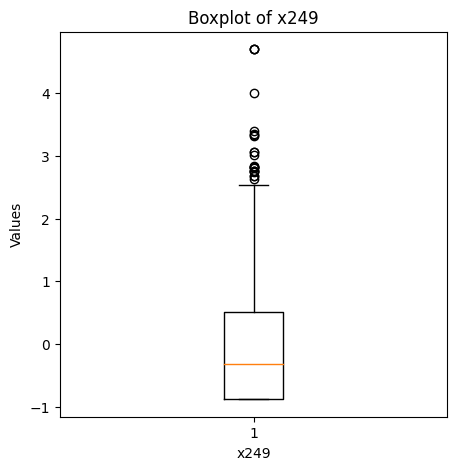

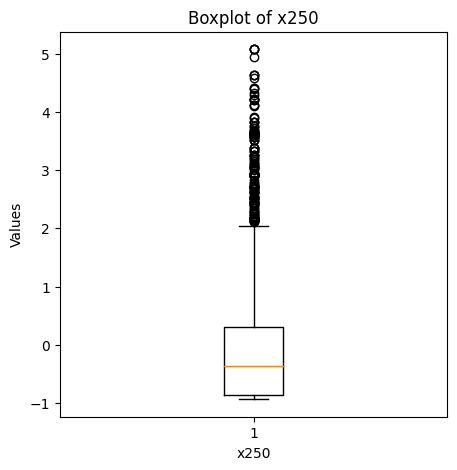

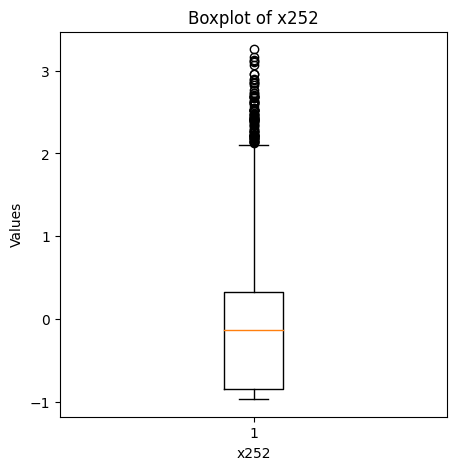

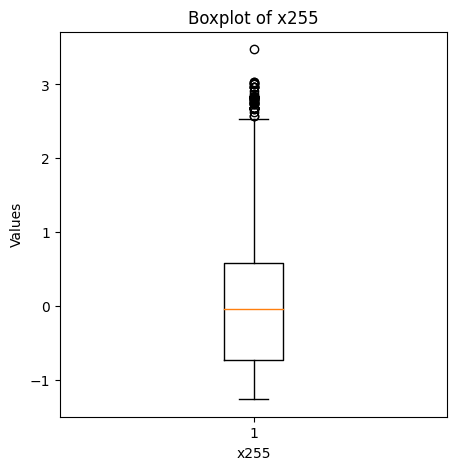

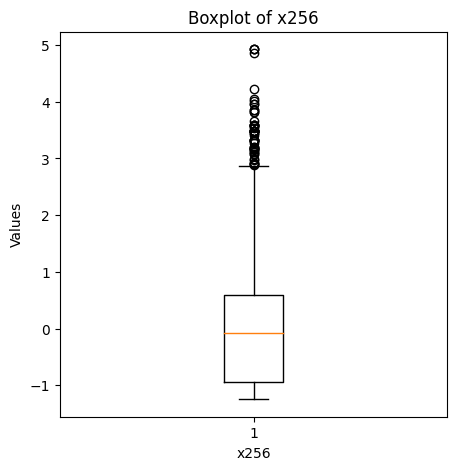

In [22]:
for column in outlier_columns:
    plt.figure(figsize=(5, 5))  # Ukuran gambar untuk setiap boxplot
    plt.boxplot(df[column])
    plt.title('Boxplot of {}'.format(column))
    plt.xlabel(column)
    plt.ylabel('Values')
    plt.show()

**💡 Insight:** The plots above have confirmed the presence of outliers in those columns.

## Pengecekkan distribusi

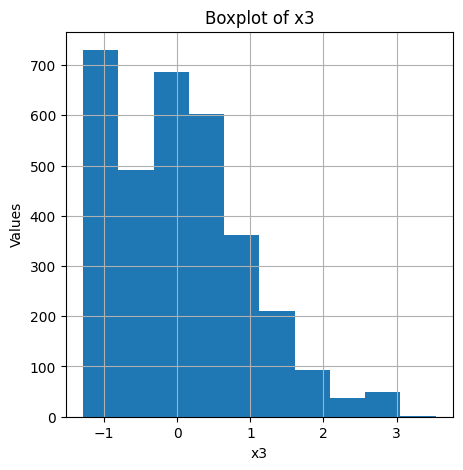

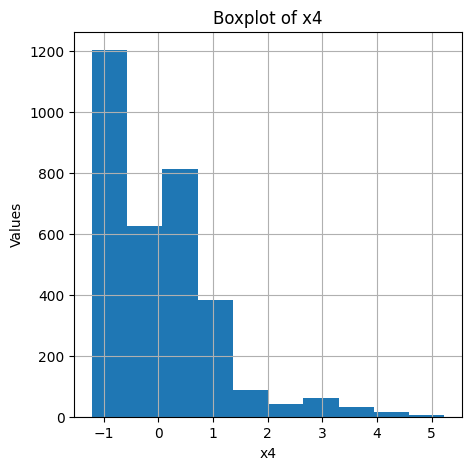

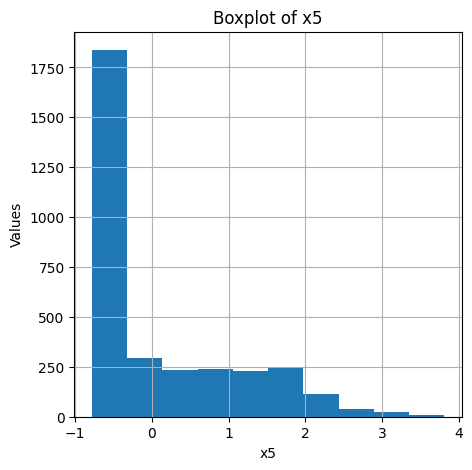

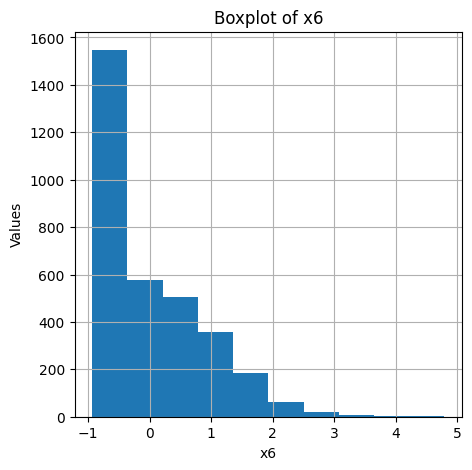

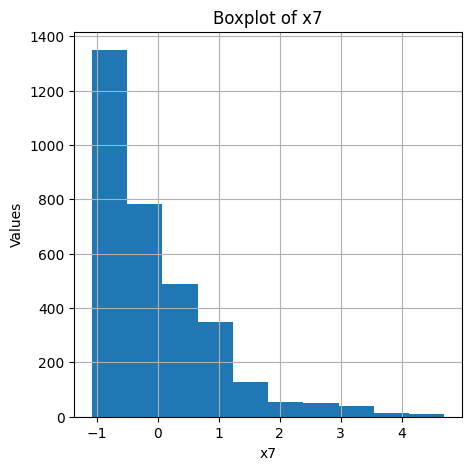

...

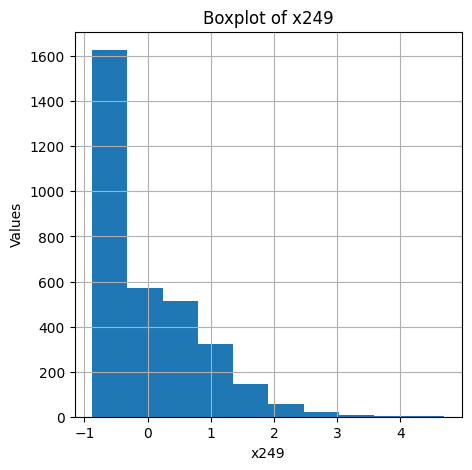

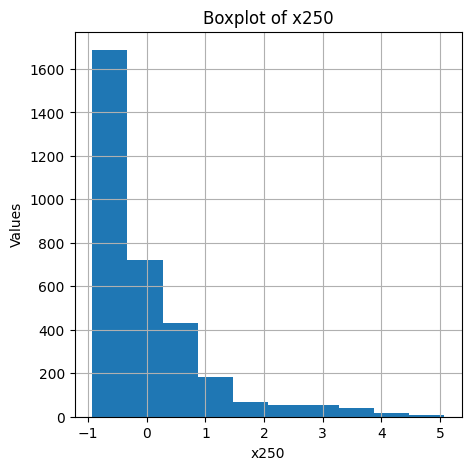

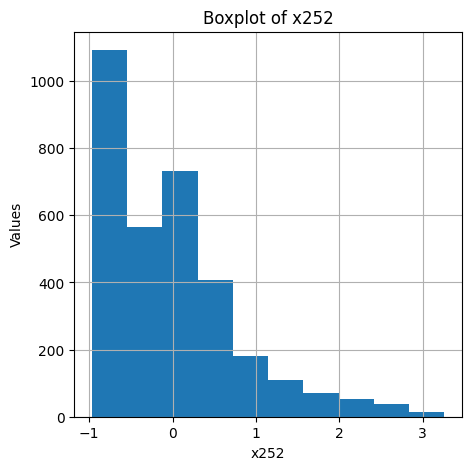

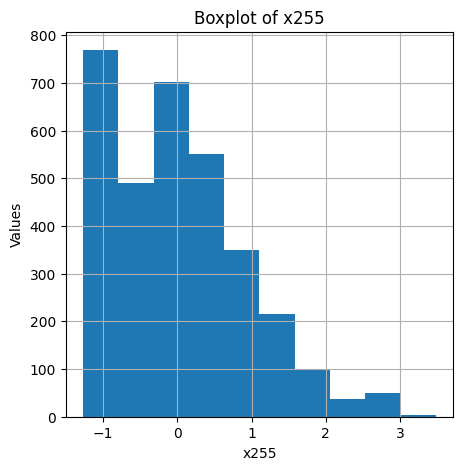

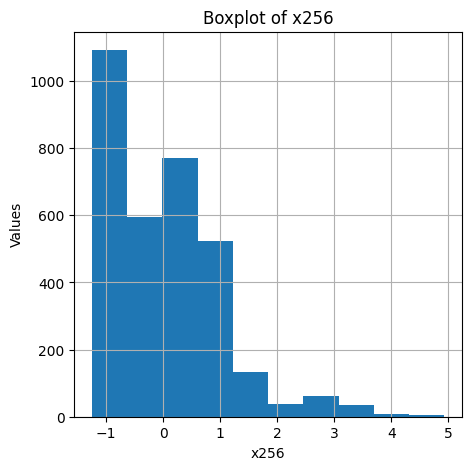

In [23]:
# Plotting histograms for all columns within the outlier columns to observe their skewness
for column in outlier_columns:
    plt.figure(figsize=(5, 5))
    fig = df[column].hist(bins=10)
    plt.title('Boxplot of {}'.format(column))
    plt.xlabel(column)
    plt.ylabel('Values')
    plt.show()

**💡 Insight:** The inspection is conducted to determine the appropriate method for addressing the issue. Given that all variables exhibit skewness or non-normal distribution, the remedy could involve employing the Interquartile Range (IQR) technique.

Viewing the Correlation Matrix for Outlier Columns

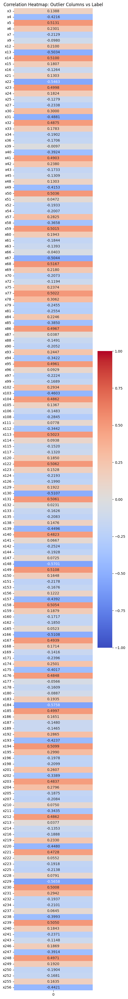

In [24]:
# Filtering the DataFrame for columns in outlier_columns
filtered_df = df[outlier_columns + ['label']]

# Calculating the correlation between outlier variables and the "label" column
correlation = filtered_df.drop('label', axis=1).corrwith(filtered_df['label'])

# Creating a correlation heatmap
plt.figure(figsize=(5, 50))
heatmap = sns.heatmap(correlation.to_frame(), annot=True, cmap="coolwarm", fmt=".4f", vmin=-1, vmax=1, cbar=True)
plt.title("Correlation Heatmap: Outlier Columns vs Label")
plt.show()

## Get the range to overcome outliers later

Use Interquartile to get the range and take the upper range.

In [25]:
upper_fences = {}

for column in outlier_columns:
    IQR = df[column].quantile(0.75) - df[column].quantile(0.25)
    Lower_fence = df[column].quantile(0.25) - (IQR * 3)
    Upper_fence = df[column].quantile(0.75) + (IQR * 3)
    outliers = df[(df[column] < Lower_fence) | (df[column] > Upper_fence)]
    upper_fences[column] = Upper_fence
    print('{} outliers are values < {} or > {}'.format(column, Lower_fence, Upper_fence))

x3 outliers are values < -4.581155405 or > 4.4746716025
x4 outliers are values < -5.700370127499999 or > 5.2304481449999995
x5 outliers are values < -5.374499125 or > 5.3425839999999996
x6 outliers are values < -5.4962386500000004 or > 5.1468655000000005
x7 outliers are values < -4.50742505 or > 4.103727185
x9 outliers are values < -4.896471835 or > 4.382132045
x12 outliers are values < -4.9572154625 or > 4.766425125
x13 outliers are values < -5.728049367500001 or > 5.414528915
x14 outliers are values < -5.1532667000000005 or > 5.118572500000001
x15 outliers are values < -5.2296542100000005 or > 4.8521697800000005
x16 outliers are values < -3.9143728300000005 or > 3.3337548400000006
x21 outliers are values < -4.5570814675 or > 4.4372189525
x22 outliers are values < -5.956046635 or > 5.7631693525
x23 outliers are values < -5.2848189075 or > 5.23150931
x24 outliers are values < -5.068391545 or > 4.67752236
x25 outliers are values < -3.8760179500000005 or > 3.4051725750000004
x27 outliers

# **Pre-processing**

## Feature Selection

In [26]:
# Removing variables with correlation values less than 0.1
threshold = 0.1
variables_to_drop = correlation.loc[correlation.abs() < threshold].index
df_dropped = df.drop(variables_to_drop, axis=1)

This is due to the fact that correlations close to 0 are regarded as random noise and do not considerably aid in categorization. Low correlation values may also cause PCA to fail because they may cause projections into a low-correlation space from low-correlation data points that have significant variation.

## Determines the X and y variables

In [27]:
X = df_dropped.drop(['label'], axis=1)

y = df_dropped['label']

## Splitting data menjadi trainning dan testing

In [28]:
# Splitting the data into training and testing sets with an 80% training and 20% testing ratio.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [29]:
X_train.shape, X_test.shape

((2611, 237), (653, 237))

Since there are no missing values or NaN values present, there is no need for any correction.

## Fixed Outliers

to fix it, I will change the value above the current upper fence to the upper fench value that I prepared earlier.

In [30]:
def apply_upper_fences(df, variable, upper_fence):
    return np.where(df[variable] > upper_fence, upper_fence, df[variable])

In [31]:
# Apply upper fences to limit the values of specific columns in X_train and X_test
# based on predefined upper fence values for each corresponding column.
for i, column in enumerate(X_train.columns):
    variable = 'x{}'.format(i + 1)
    if variable in upper_fences:
        upper_fence = upper_fences[variable]
        X_train[column] = apply_upper_fences(X_train, column, upper_fence)

In [32]:
for i, column in enumerate(X_test.columns):
    variable = 'x{}'.format(i + 1)
    if variable in upper_fences:
        upper_fence = upper_fences[variable]
        X_test[column] = apply_upper_fences(X_test, column, upper_fence)

In [33]:
# Since some features have already been removed during feature selection.
columns_to_remove = ['x39', 'x51', 'x66', 'x87', 'x132', 'x213', 'x9', 'x96', 'x111', 'x114', 'x141', 'x147', 'x165', 'x177', 'x180', 'x210', 'x222', 'x228', 'x237']

for column in columns_to_remove:
    if column in outlier_columns:
        outlier_columns.remove(column)

print(outlier_columns)

['x3', 'x4', 'x5', 'x6', 'x7', 'x12', 'x13', 'x14', 'x15', 'x16', 'x21', 'x22', 'x23', 'x24', 'x25', 'x27', 'x30', 'x31', 'x32', 'x33', 'x34', 'x36', 'x40', 'x41', 'x42', 'x43', 'x45', 'x48', 'x49', 'x50', 'x52', 'x54', 'x57', 'x58', 'x59', 'x60', 'x61', 'x63', 'x67', 'x68', 'x69', 'x70', 'x72', 'x75', 'x77', 'x78', 'x79', 'x81', 'x84', 'x85', 'x86', 'x88', 'x90', 'x93', 'x94', 'x95', 'x97', 'x99', 'x102', 'x103', 'x104', 'x105', 'x106', 'x108', 'x112', 'x113', 'x115', 'x117', 'x120', 'x122', 'x123', 'x124', 'x126', 'x129', 'x130', 'x131', 'x133', 'x135', 'x138', 'x139', 'x140', 'x142', 'x144', 'x148', 'x149', 'x150', 'x151', 'x153', 'x156', 'x157', 'x158', 'x159', 'x160', 'x162', 'x166', 'x167', 'x168', 'x169', 'x171', 'x174', 'x175', 'x176', 'x178', 'x183', 'x184', 'x185', 'x186', 'x187', 'x189', 'x192', 'x193', 'x194', 'x195', 'x196', 'x198', 'x201', 'x202', 'x203', 'x204', 'x205', 'x207', 'x211', 'x212', 'x214', 'x216', 'x219', 'x220', 'x221', 'x223', 'x225', 'x229', 'x230', 'x231'

In [34]:
X_train[outlier_columns].describe()

,x3,x4,x5,x6,x7,x12,x13,x14,x15,x16,...,x241,x243,x246,x247,x248,x249,x250,x252,x255,x256
count,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,...,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000,2611.000000
mean,0.018073,-0.043650,0.009348,-0.062685,-0.066018,0.013101,-0.050826,0.007112,-0.053097,-0.054859,...,-0.033305,-0.007634,0.024997,-0.040306,0.025824,-0.073438,-0.070406,-0.064590,0.000136,-0.029541
std,0.946997,1.070339,1.028463,0.907012,0.994106,0.961233,1.010627,0.992239,0.872152,1.017775,...,0.992278,0.835290,0.965951,1.042433,1.016297,0.859377,1.016384,0.835894,0.945463,1.025732
min,-1.285932,-1.214555,-0.781463,-0.934908,-1.076878,-1.202395,-1.338871,-0.751050,-0.908872,-0.838019,...,-1.143711,-0.964174,-1.260551,-1.100400,-0.783508,-0.877666,-0.932956,-0.965767,-1.265504,-1.244573
25%,-0.721727,-1.022737,-0.781463,-0.934908,-0.809590,-0.796834,-0.948717,-0.751050,-0.908872,-0.804759,...,-0.777806,-0.859560,-0.759387,-1.020095,-0.783508,-0.877666,-0.857890,-0.845917,-0.759458,-0.935243
50%,0.009236,-0.097033,-0.601720,-0.287215,-0.334166,-0.050814,-0.061321,-0.601672,-0.232968,-0.379280,...,-0.273344,-0.032869,-0.016913,-0.128316,-0.531661,-0.313978,-0.362799,-0.133794,-0.032775,-0.078119
75%,0.599590,0.543515,0.712648,0.569663,0.424913,0.606138,0.632364,0.678733,0.532184,0.226686,...,0.518341,0.453805,0.627134,0.485891,0.783596,0.499729,0.310293,0.333098,0.583348,0.589629
max,3.532661,5.230448,3.814274,4.790517,4.103727,3.358786,4.467436,3.756592,4.598652,4.852170,...,4.188783,3.173414,3.510296,4.407034,3.514284,4.699131,5.075081,3.258275,3.476898,4.334419


It can be observed that the maximum values have improved compared to before.






## Standard Scaler

In [35]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Even though the data magnitudes are relatively similar, it's still necessary to apply StandardScaler to ensure that each column has precisely the same scale. This prevents any potential bias from affecting the model's performance.

## Dimension reduction

### PCA

In [36]:
from sklearn.decomposition import PCA

pca = PCA(0.999)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [37]:
print(X_train_pca.shape)
pd.DataFrame(X_train_pca).sample(5)

(2611, 20)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
1472,-5.936890,-1.056354,-7.033029,-2.624615,-2.755755,-1.324133,0.503564,1.827329,-1.355372,0.747299,0.605413,0.567741,0.508822,0.240262,-0.441954,-0.118978,-0.034861,0.040946,-0.118073,-0.156798
72,10.437531,1.353878,11.211285,-3.735534,-0.330983,-8.333004,2.120347,-1.791141,0.067896,-0.038671,0.000743,0.744736,-0.019872,0.084355,0.015157,-0.493551,-0.021774,-0.188415,-0.159899,-0.066527
2260,7.892846,-5.568650,5.079612,-6.547675,2.966071,-2.139411,-2.002690,-3.727164,-1.383023,-1.312917,-0.201668,0.536052,-0.063788,0.035377,-0.166968,0.084359,-0.096237,0.272113,0.090259,-0.466747
5,14.018705,5.921366,4.735679,0.870515,-1.261034,-5.536070,1.876222,-1.793157,0.519981,0.727461,-1.018701,-0.764026,-0.096518,0.238150,-0.004502,-0.162065,0.160484,-0.123395,-0.038864,-0.047679
1825,1.626117,-3.198320,-7.317597,0.534246,-6.361564,-0.822067,2.332199,-0.898041,0.613250,-0.103402,-0.342626,-0.301480,-0.200227,-0.302793,0.018938,-0.123899,0.069607,0.100413,-0.172527,-0.130722



In this step, I perform dimensionality reduction due to the presence of 148 dimensions which is excessively high and poses a risk of encountering the curse of dimensionality in the model. To mitigate this, I employ Principal Component Analysis (PCA) to reduce the number of dimensions while retaining 99.9% of the variance present in the data. This process effectively reduces the dimensionality from 148 to just 20.

# **Modelling**

## **Random Forest**

I will use Random Forest as it can handle complex data and is not sensitive to outliers.

For the model's parameters, I will use cross-validation to determine the best value for the "n_estimators" parameter.

The "n_estimators" parameter is used in several machine learning algorithms, particularly in ensemble algorithms like Random Forest and Gradient Boosting. This parameter refers to the number of trees or models that will be used in the ensemble.

In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# List of n_estimators values to be tested
n_estimators_values = [10, 50, 100, 200, 300]

# Initialize a list to store cross-validation scores
cv_scores = []

# Perform cross-validation for each n_estimators value
for n_estimators in n_estimators_values:
    model = RandomForestClassifier(n_estimators=n_estimators, random_state=0)
    scores = cross_val_score(model, X_train_pca, y_train, cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())

# Find the n_estimators value with the highest cross-validation score
best_n_estimators = n_estimators_values[cv_scores.index(max(cv_scores))]

print("Best n_estimators:", best_n_estimators)

Best n_estimators: 200


The best n_estimator is 200, so I will use n_estimator 200.

In [39]:
from sklearn.metrics import accuracy_score

In [40]:
rfc = RandomForestClassifier(n_estimators=200, random_state=0)

# fit model
rfc.fit(X_train_pca, y_train)

# Predict
y_predRF_200 = rfc.predict(X_test_pca)

# Predict
y_predTrain_200 = rfc.predict(X_train_pca)

Evaluate the Stacking Model's performance on the test data and visualize the results using a confusion matrix.

              precision    recall  f1-score   support

           0     0.7744    0.7135    0.7427       178
           1     0.7514    0.7354    0.7433       189
           2     0.9195    0.8163    0.8649        98
           3     0.8065    0.9309    0.8642       188

    accuracy                         0.7979       653
   macro avg     0.8129    0.7990    0.8038       653
weighted avg     0.7987    0.7979    0.7962       653



Text(0.5, 1.0, 'Confusion Matrix Random Forest')

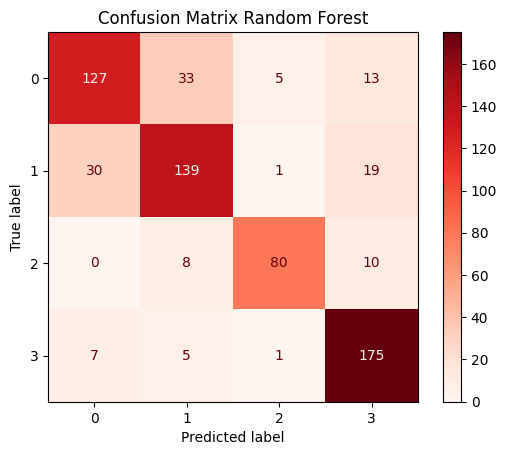

In [41]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Membuat confusion matrix
cm = confusion_matrix(y_test, y_predRF_200)

print(classification_report(y_test, y_predRF_200, digits=4))

# Membuat heatmap untuk matriks confusion
confusion_display = ConfusionMatrixDisplay(confusion_matrix=cm)

# Set the title for the confusion matrix plot
confusion_display.plot(cmap='Reds')
plt.title('Confusion Matrix Random Forest')


In [42]:
from sklearn.metrics import classification_report

print(classification_report(y_train, y_predTrain_200, digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000       748
           1     1.0000    1.0000    1.0000       748
           2     1.0000    1.0000    1.0000       402
           3     1.0000    1.0000    1.0000       713

    accuracy                         1.0000      2611
   macro avg     1.0000    1.0000    1.0000      2611
weighted avg     1.0000    1.0000    1.0000      2611



## **Stacking Model**

In [43]:
# create and train a Stacking Classifier to improve predictive performance

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

estimators = [
  ('rf', RandomForestClassifier()),
  ('svr',  SVC()),
  ("knn", KNeighborsClassifier(n_neighbors=7, weights="distance")),
]
sc = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
sc.fit(X_train_pca, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


StackingClassifier(estimators=[('rf', RandomForestClassifier()), ('svr', SVC()),
                               ('knn',
                                KNeighborsClassifier(n_neighbors=7,
                                                     weights='distance'))],
                   final_estimator=LogisticRegression())

Evaluate the Stacking Model's performance on the test data and visualize the results using a confusion matrix.

In [44]:
y_sc = sc.predict(X_test_pca)

              precision    recall  f1-score   support

           0     0.7805    0.7191    0.7485       178
           1     0.7596    0.7354    0.7473       189
           2     0.8542    0.8367    0.8454        98
           3     0.8190    0.9149    0.8643       188

    accuracy                         0.7979       653
   macro avg     0.8033    0.8015    0.8014       653
weighted avg     0.7966    0.7979    0.7960       653



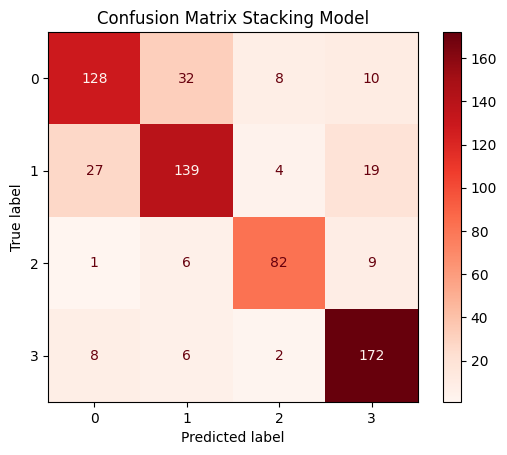

In [45]:
cm_sc = confusion_matrix(y_test, y_sc)

print(classification_report(y_test, y_sc, digits=4))
confusion_display = ConfusionMatrixDisplay(confusion_matrix=cm_sc)

# Set the title for the confusion matrix plot
confusion_display.plot(cmap='Reds')
plt.title('Confusion Matrix Stacking Model')

plt.show()

Evaluate the performance of stacking model on the training data using the scaled and PCA-transformed features.

In [46]:
y_Train_sc = sc.predict(X_train_pca)

In [47]:
cm_sc = confusion_matrix(y_train, y_Train_sc)

print(classification_report(y_train, y_Train_sc, digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000       748
           1     1.0000    1.0000    1.0000       748
           2     1.0000    1.0000    1.0000       402
           3     1.0000    1.0000    1.0000       713

    accuracy                         1.0000      2611
   macro avg     1.0000    1.0000    1.0000      2611
weighted avg     1.0000    1.0000    1.0000      2611



Using an ensemble stacking model with a random forest, an SVC with an RBF kernel to describe non-linear data, and a KNN with k = 7 and weighting on distance, I created the second model. The forecasts of each model are then examined using logistic regression, yielding a model that is notably superior to voting. The general consensus is that combining these models will result in better outcomes.

# **Conclusion**

From the experimentation of these two techniques, the **best-performing model is the Stacking Model.**

Hence, the optimal model is the Stacking Model, achieving an accuracy of 79.94%, with precision, recall, and F1 score consistently stable at around 80%. However, when it comes to predicting class 3, the Random Forest model slightly outperforms. The accuracy of the Random Forest model is also not significantly different, standing at 79.79%, indicating that both models exhibit commendable performance.

Subsequently, when testing on the training data, both models achieved a perfect accuracy of 100%. While this is a positive sign, it also raises several potential concerns, namely:
* **Possible Overfitting:** The attainment of 100% accuracy on the training data often signals overfitting, where the models might be overly tailored to the training data, leading to a substantial drop in performance when exposed to new data. Consider investigating any indications of overfitting that necessitate further analysis.

Hence, this aspect can be taken into consideration for future endeavors, such as more in-depth cross-validation and other relevant analyses.

Dikarena data label yang kurang jelas sehingga tidak dapat dilakukan analisi mendetail terkait confusion matrixnya.